In [2]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import xarray as xr
pylab.rcParams['figure.figsize'] = (16., 9.)
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import pandas as pd
import datetime 
#%matplotlib inline

In [1]:
cd ..

/home/ck/pythonWorkspace/proj_CEH


In [8]:
olr = xr.open_mfdataset('/media/ck/Elements/Africa/WestAfrica/CP4/CP4hist/lw_out_PBLtop/lw_out_PBLtop_fullPL_A1hr_mean_ah261_4km_200207*.nc')

In [50]:
olr_hour = olr.isel(time=((olr['time.day']>=7) &(olr['time.day']<=8) & (olr['time.hour']>=15) &(olr['time.hour']<=22)))/100

In [51]:
olr_hour = olr_hour.sel(latitude=slice(4.5,19), longitude=slice(-18,10))

In [52]:
def draw_map(ax, dat, lat, lon, title='', levels=None, cbarlabel='', cmap='', bl=False, ll=True, boxlabel=False):
    import matplotlib.ticker as mticker
    
    ax.set_facecolor('lightgrey')
   
    plt.contourf(lon, lat, dat, transform=ccrs.PlateCarree(), cmap=cmap, levels=levels, alpha=0.7, extend='both')
    cbar = plt.colorbar()
    cbar.set_label(cbarlabel)
    plt.contour(lon, lat, dat, transform=ccrs.PlateCarree(), colors='white', levels=levels, linewidths=0.1)
    ax.coastlines()
    #Gridlines
    xl = ax.gridlines(draw_labels=True, linestyle='dotted', linewidths=0.001);
    xl.top_labels = False
    xl.xlines = False
    xl.ylines=False
    xl.right_labels = False
    xl.bottom_labels = bl
    xl.left_labels = False
    xl.ylocator = mticker.FixedLocator([6, 9, 12,15,18])
    xl.xlocator = mticker.FixedLocator([-15, -10,-5,0,5,10,15])
    #xl.grid(False)
    # Countries
    ax.add_feature(cartopy.feature.BORDERS, linestyle='--', linewidth=0.5);
   # plt.grid(False)
    plt.title(title, fontsize=10)

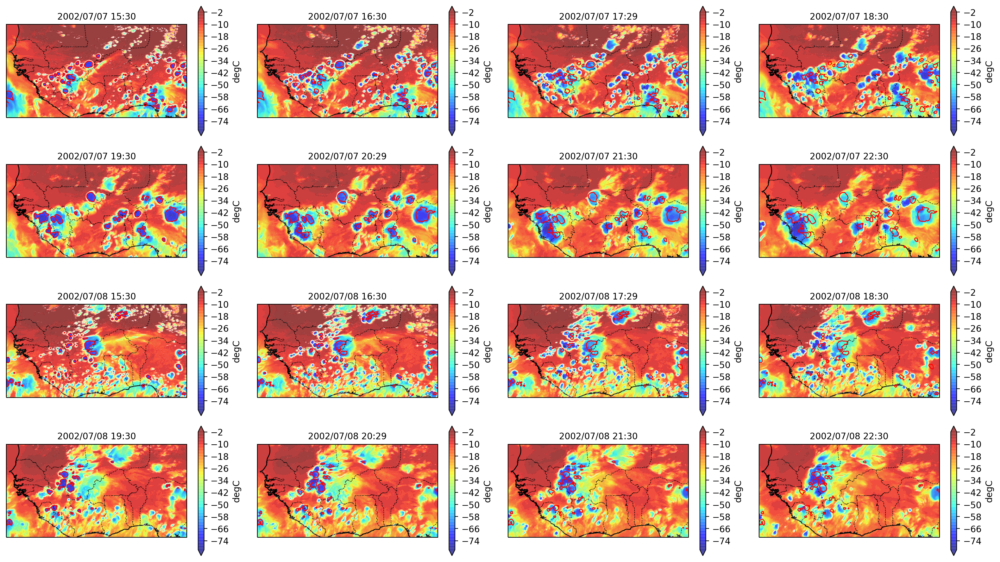

In [53]:
f = plt.figure(figsize=(16,9), dpi=200)
cnt=1
contours = [0,0,0,0,4,4,4,4,8,8,8,8,12,12,12,12]
for ids in range(0,16):
    dd = olr_hour['lw_out_PBLtop'].isel(time=ids)
    ax = f.add_subplot(4,4,cnt, projection=ccrs.PlateCarree())
    date = datetime.datetime(dd['time.year'].values, dd['time.month'].values, dd['time.day'].values, dd['time.hour'].values, dd['time.minute'].values)
    draw_map(ax, dd, dd.latitude, dd.longitude, title=date.strftime("%Y/%m/%d %H:%M"), levels=np.arange(-80,0,2), cbarlabel=r'degC', cmap='jet') 
    ax.contour( dd.longitude, dd.latitude, olr_hour['lw_out_PBLtop'].isel(time=contours[ids])*-1, transform=ccrs.PlateCarree(), colors='red', levels=[65,100], linewidths=1)
    cnt +=1
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/CP4/CP4_example_convection_perHour.jpg')

In [34]:
meteosat = xr.open_dataset('/media/ck/Elements/Africa/WestAfrica/cores_MFGandMSG_VERA/cores/coresPower_MSG_-40_700km2_-50points_dominant_2009_07.nc')

In [41]:
Molr_hour = meteosat['tir'].isel(time=((meteosat['time.day']>=6) &(meteosat['time.day']<=7) & (meteosat['time.hour']>=15) &(meteosat['time.hour']<=22) & (meteosat['time.minute']==30)))/100#isel(time=((meteosat['time.hour']==17) & (meteosat['time.minute']==30)))/100

In [42]:
Molr_hour = Molr_hour.sel(lat=slice(4.5,19), lon=slice(-18,10))

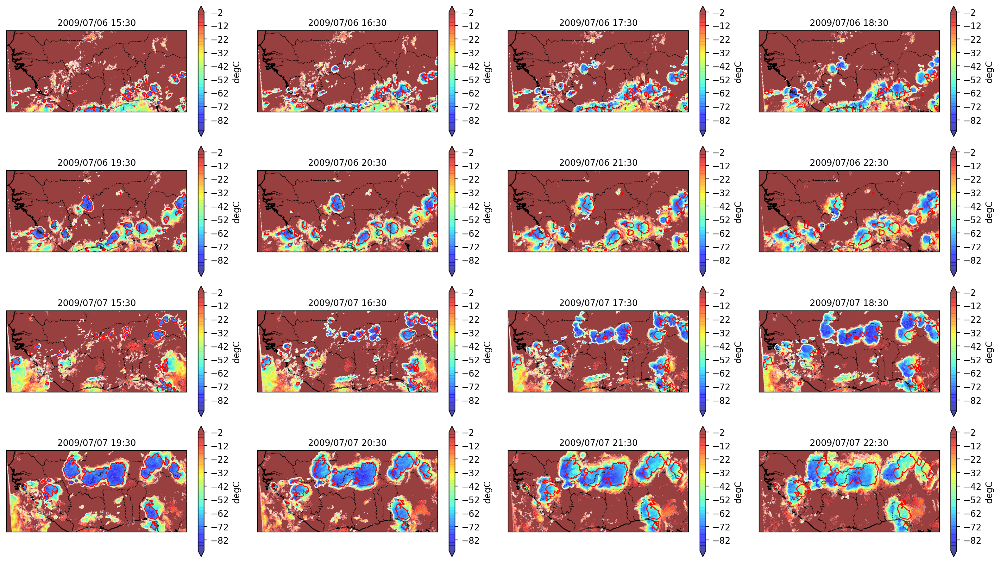

In [49]:
f = plt.figure(figsize=(16,9), dpi=200)
cnt=1
contours = [0,0,0,0,4,4,4,4,8,8,8,8,12,12,12,12]
for ids in range(16):
    dd = Molr_hour.isel(time=ids)
    ax = f.add_subplot(4,4,cnt, projection=ccrs.PlateCarree())
    date = datetime.datetime(dd['time.year'].values, dd['time.month'].values, dd['time.day'].values, dd['time.hour'].values, dd['time.minute'].values)
    draw_map(ax, dd, dd.lat, dd.lon, title=date.strftime("%Y/%m/%d %H:%M"), levels=np.arange(-90,0,2), cbarlabel=r'degC', cmap='jet')
    ax.contour( dd.lon, dd.lat, Molr_hour.isel(time=contours[ids])*-1, transform=ccrs.PlateCarree(), colors='red', levels=[65,100], linewidths=1)
    cnt +=1
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/CP4/Meteosat_example_convection_perHour.jpg')